In [1]:
import pandas as pd
import geopandas as gpd
import pickle

%matplotlib inline
import matplotlib.pyplot as plt

root_path = "D:/GeoData/"
Main_CRS = "EPSG:27700"

In [2]:
#Function for opening saved data
def load_obj(name ):
    with open(root_path + 'WorkingData/' + name + '.pkl', 'rb') as f:
        return pickle.load(f)

In [3]:
#Import all 5km clipped maps
ClippedMaps_5k = load_obj("ClippedMaps_5k")

In [4]:
#List the available maps
ClippedMaps_5k.keys()

dict_keys(['Hawkshead', 'South_London', 'Loch_Lomond', 'Furness', 'Croydon', 'StPauls', 'ElephantCastle', 'M4_junct', 'M6_Junctions', 'Kendal', 'Milford Haven', 'Birmingham', 'Euston'])

In [69]:
#Choose a map to play with
name = "Furness"
Mapset = ClippedMaps_5k[name]

In [70]:
#What elements are available?
Mapset.keys()

dict_keys(['All_GB', 'National_Parks', 'LocalAuthorities', 'LSOA', 'GreenSpace', 'Rivers', 'Railway_Lines', 'Woodland_Region', 'Urban_Region', 'Foreshor_Region', 'Ferry_Line', 'Coastline', 'Gridlines', 'Lakes', 'Road_Link', 'MotorwayJunctions', 'Motorway', 'A_Roads', 'B_Roads', 'Other_roads', 'NSPL_gdf', 'LandReg_gdf'])

In [90]:
#Map of transport features
def plotTransport(name):
    Mapset = ClippedMaps_5k[name]
    
    fig, ax = plt.subplots(1, figsize=(15,15))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    plt.title("Transport Features around " + name)

    if len(Mapset['All_GB'])>0:
        Mapset['All_GB'].plot(ax=ax, color='none', edgecolor='black')

    if len(Mapset['Road_Link'])>0:
        Mapset['Road_Link'].plot(ax=ax, color='black', alpha=0.3)

    if len(Mapset['Urban_Region'])>0:
        Mapset['Urban_Region'].plot(ax=ax, color='gray', alpha=0.1)

    if len(Mapset['NSPL_gdf'])>0:
        Mapset['NSPL_gdf'].plot(ax=ax, color='blue', alpha=0.15, markersize=12)

    if len(Mapset['Railway_Lines'])>0:
        Mapset['Railway_Lines'].plot(ax=ax, color='black', linestyle='-.')

    if len(Mapset['Ferry_Line'])>0:
        Mapset['Ferry_Line'].plot(ax=ax, color='blue', linestyle='-.')
        
    plt.savefig("Images/" + name + 'TransportMap.png',dpi=300)
    
#Map of natural features (+roads)

def plotNatural(name):
    Mapset = ClippedMaps_5k[name]
    
    fig, ax = plt.subplots(1, figsize=(15,15))
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_facecolor('aqua')

    plt.title("Sort of Natural Features around " + name)

    if len(Mapset['All_GB'])>0:
        Mapset['All_GB'].plot(ax=ax, color='white')

    if len(Mapset['Road_Link'])>0:
        Mapset['Road_Link'].plot(ax=ax, color='black', alpha=0.2)

    if len(Mapset['GreenSpace'])>0:
        Mapset['GreenSpace'].plot(ax=ax, color='green', alpha=0.7)

    if len(Mapset['Woodland_Region'])>0:
        Mapset['Woodland_Region'].plot(ax=ax, color='brown', alpha=0.7)

    if len(Mapset['Rivers'])>0:
        Mapset['Rivers'].plot(ax=ax, color='blue')

    if len(Mapset['Lakes'])>0:
        Mapset['Lakes'].plot(ax=ax, color="none", hatch="OO", edgecolor="b", alpha=0.7)  

    if len(Mapset['Foreshor_Region'])>0:
        Mapset['Foreshor_Region'].plot(ax=ax, color="blue", alpha=0.5)  

    if len(Mapset['National_Parks'])>0:
        Mapset['National_Parks'].plot(ax=ax, color='none', hatch="..", edgecolor="r", alpha=0.25)  
        
    plt.savefig("Images/" + name + 'NaturalMap.png',dpi=300)
    
def plotmaps(name):
    plotTransport(name)
    plotNatural(name)

C:\Users\richa\AppData\Local\Temp/ipykernel_11596/3934751499.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, figsize=(15,15))


[('Hawkshead', None),
 ('South_London', None),
 ('Loch_Lomond', None),
 ('Furness', None),
 ('Croydon', None),
 ('StPauls', None),
 ('ElephantCastle', None),
 ('M4_junct', None),
 ('M6_Junctions', None),
 ('Kendal', None),
 ('Milford Haven', None),
 ('Birmingham', None),
 ('Euston', None)]

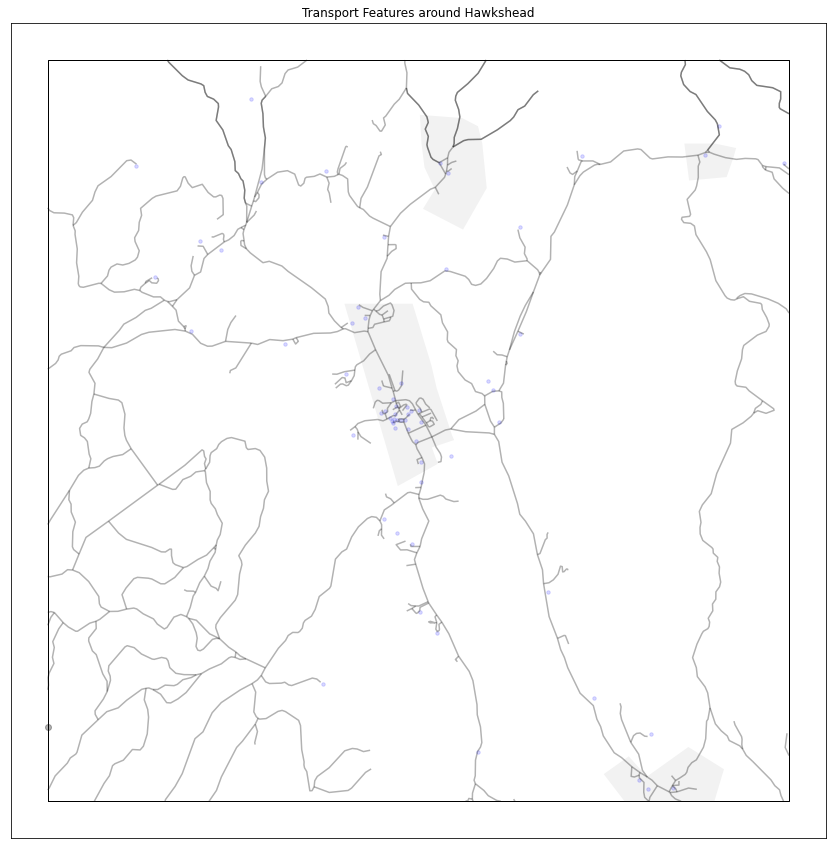

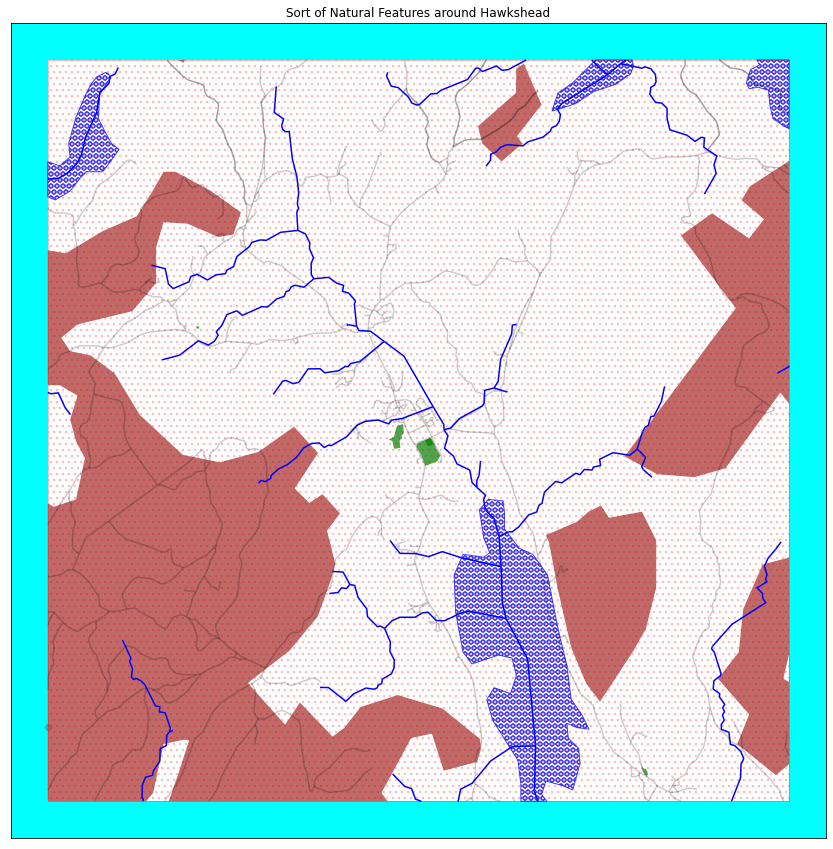

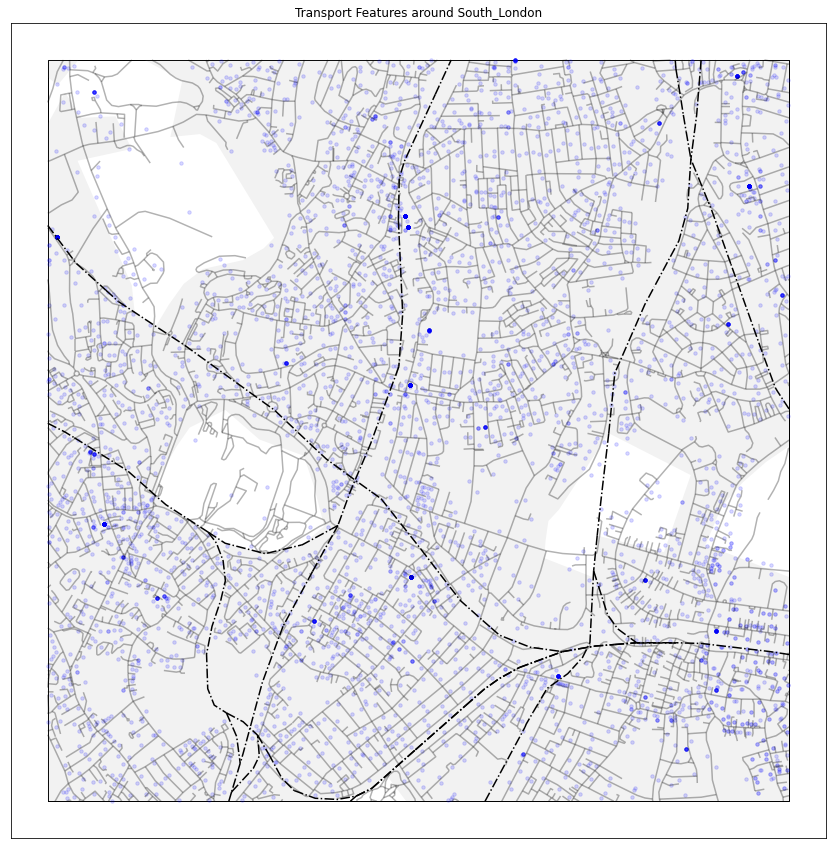

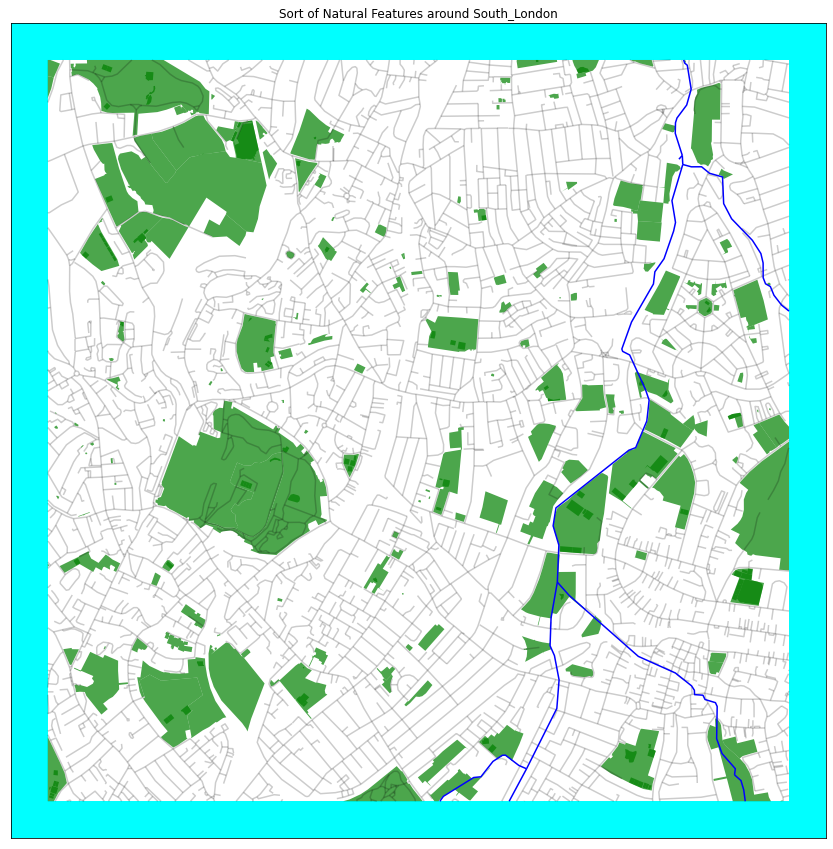

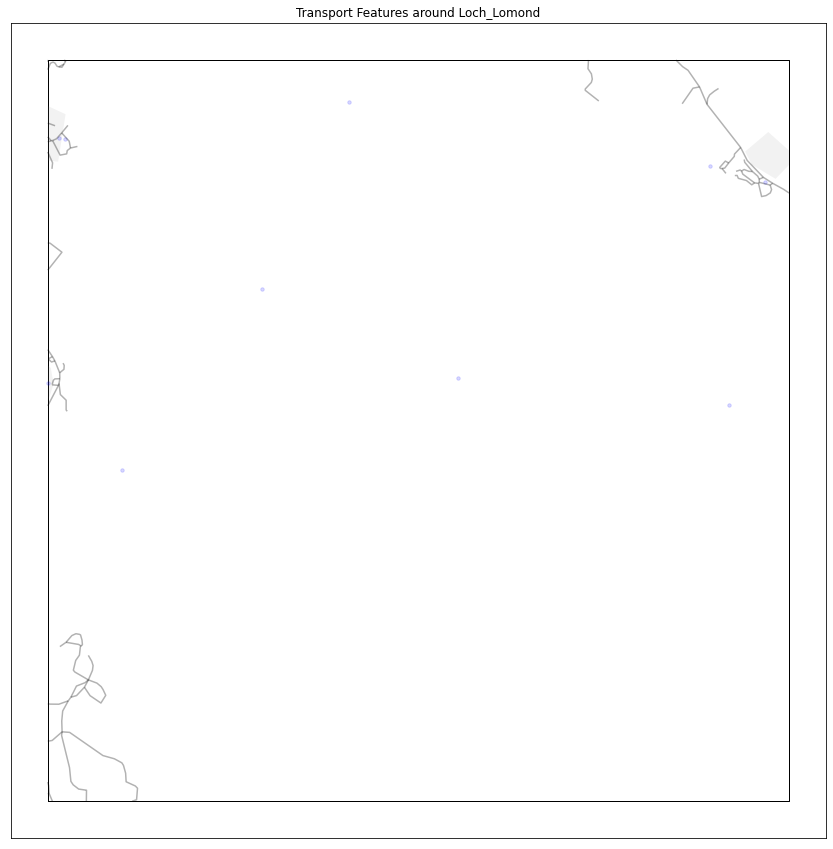

...

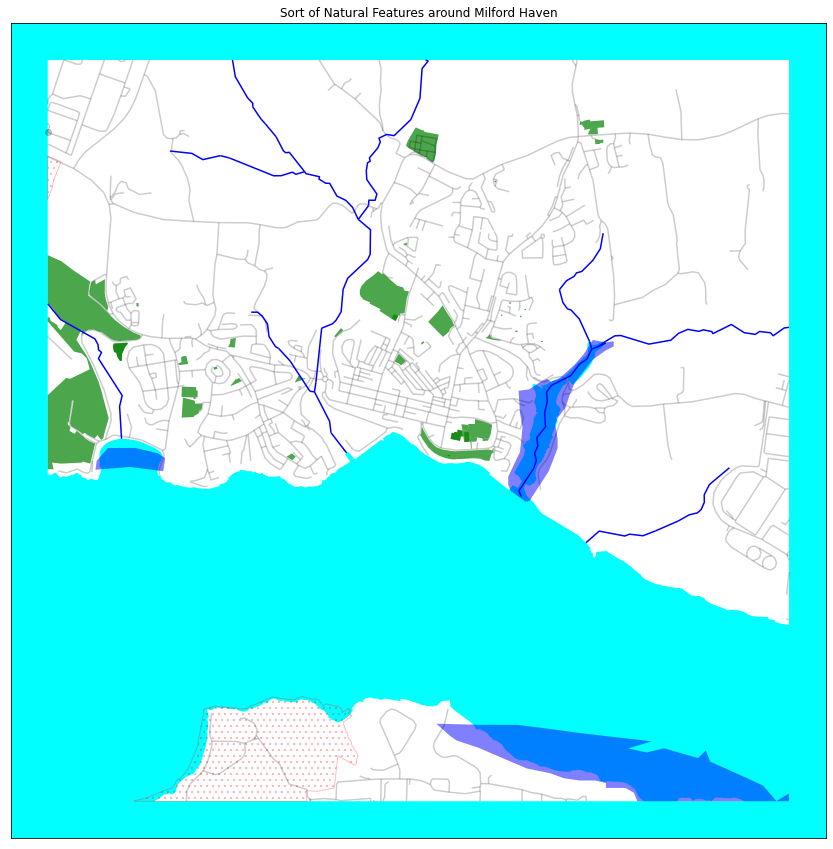

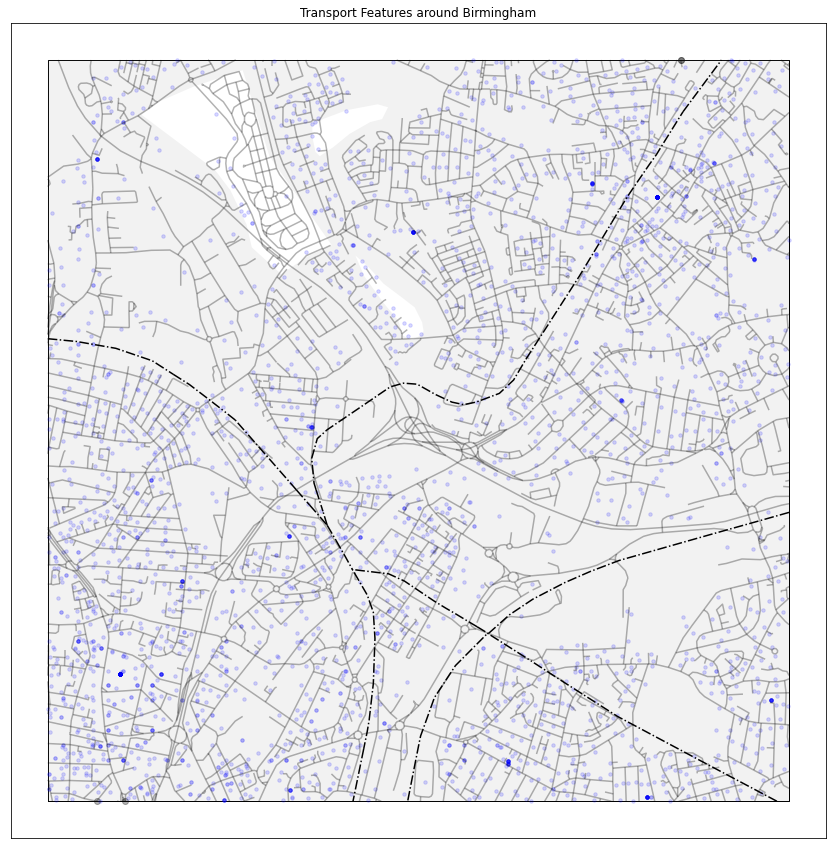

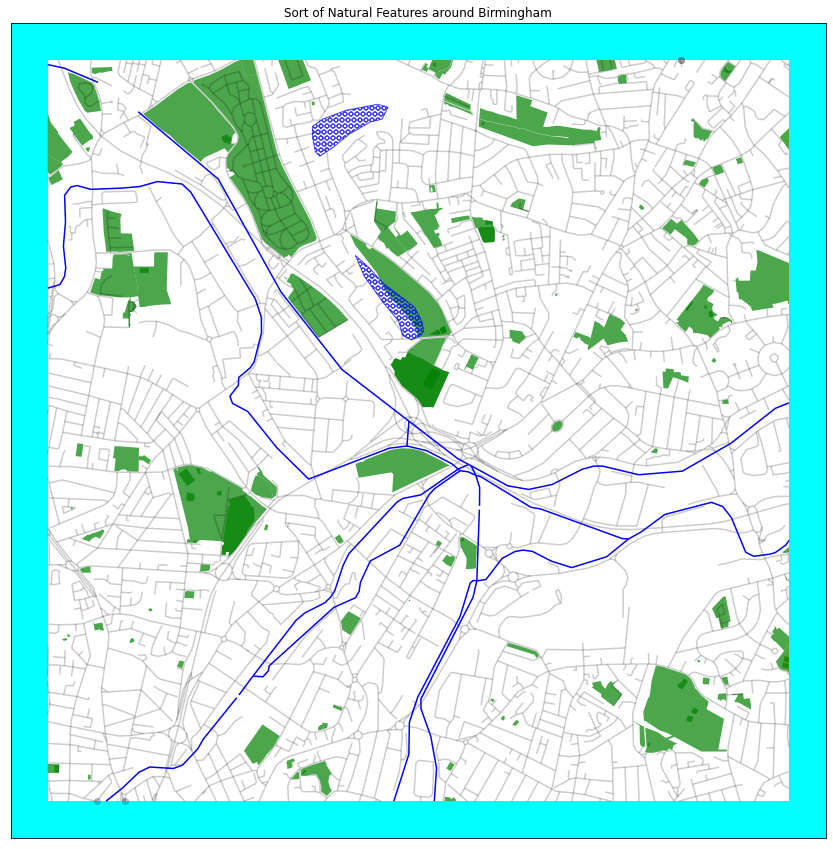

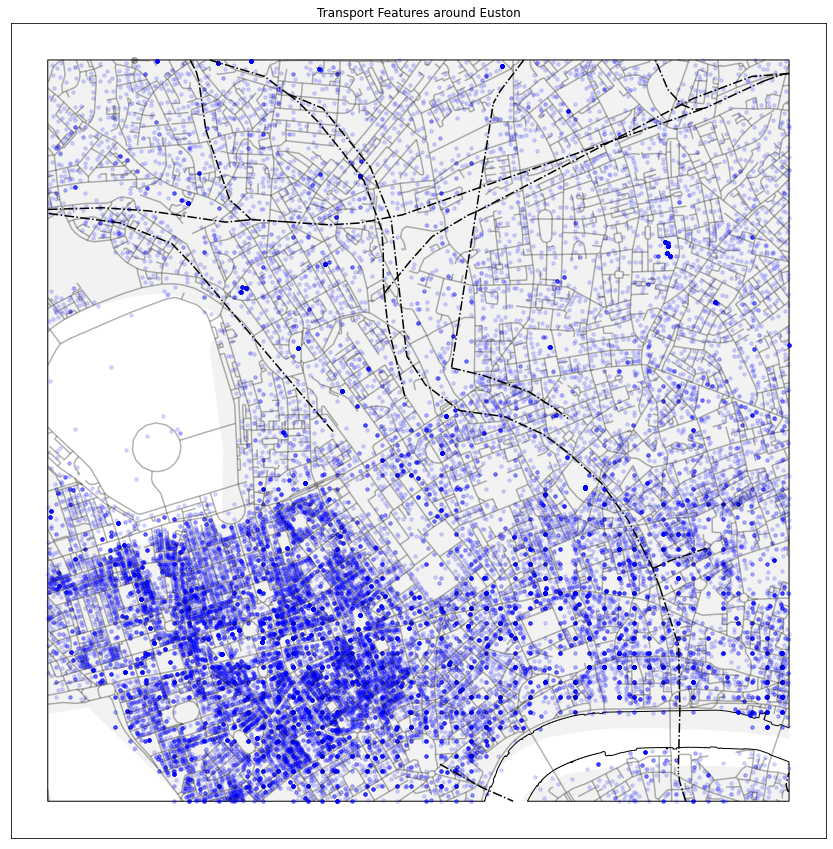

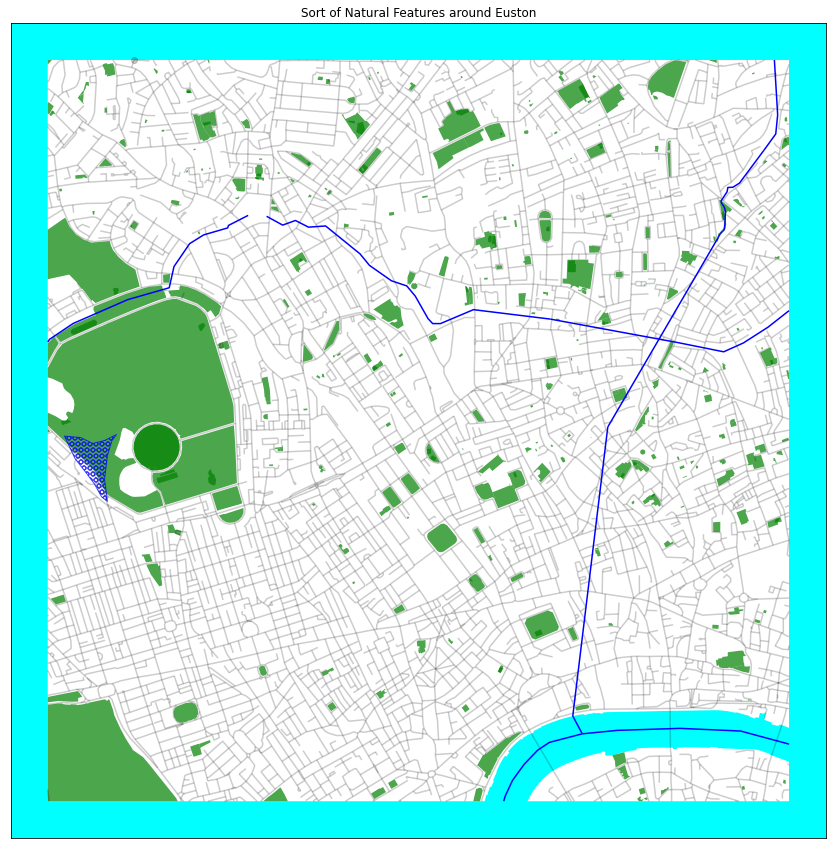

In [92]:
[(k, plotmaps(k)) for k, v in ClippedMaps_5k.items()]